Name: Sonam Rinzin Gurung <br>
ID: 2059524

## Image Compression with Principle Component Analysis
### Principle Component Analysis
Principal Component Analysis (PCA) is a type of "Unsupervised Machine Learning" method that aims to discover accurate low-dimensional approximations for high-dimensional datasets.<br>
Principal component analysis aims to extract the essential features of a dataset by identifying the main components that explain the majority of the variation among the observations. 

In [1]:
# import libraries for image processing and plotting
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

#### Read the image and convert it to numpy array 

In [2]:
# load image as PIL image
img = Image.open('testImage.jpg')

# convert image to numpy array
imgArray = np.array(img)

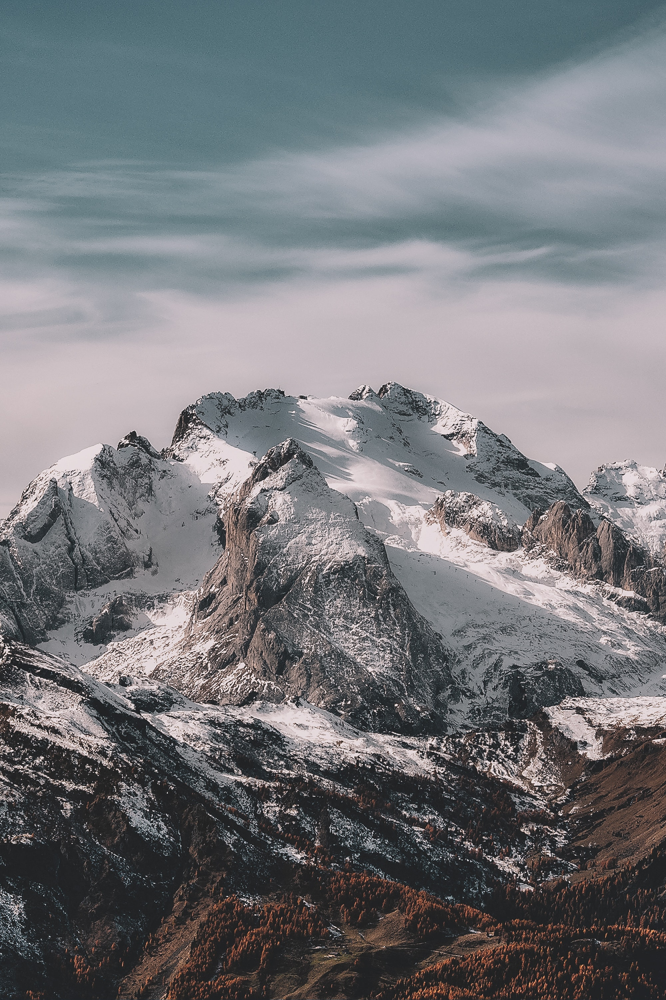

In [3]:
# display image
img

In [4]:
# Print the image array details

print("Pixel Type: ", imgArray.dtype) # data type of the array
print("Image Size: ", imgArray.shape) # shape is (height, width, color channels)
print("Image Dimensions: ", imgArray.ndim) #dimension of the array

Pixel Type:  uint8
Image Size:  (3000, 2000, 3)
Image Dimensions:  3


#### Convert the image to grayscale to reduce the dimensionality of the image

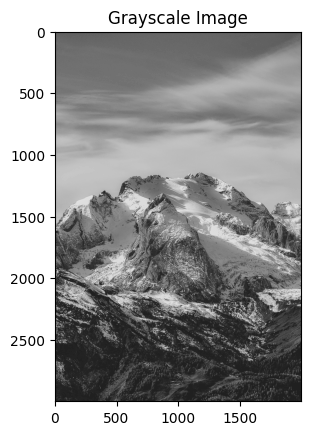

In [5]:
# convert image to grayscale and display

imgGray = img.convert('L')  # convert to grayscale using 'L' mode
imgGrayArray = np.array(imgGray) # convert the grayscale image to numpy array

# display the grayscale image
plt.imshow(imgGrayArray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

In [6]:
# Print the grayscale image array details

print("Pixel Type: ", imgGrayArray.dtype) # data type of the array
print("Image Size: ", imgGrayArray.shape) # shape is (height, width)
print("Image Dimensions: ", imgGrayArray.ndim) #dimension of the array


Pixel Type:  uint8
Image Size:  (3000, 2000)
Image Dimensions:  2


### Normalize the image array to have values between 0 and 1

In [7]:
# normalize the grayscale image array to 0-1 range
# this will convert the pixel values from 0-255 to 0-1 range (float) 

imgGrayArray = imgGrayArray/255

imgGrayArray

array([[0.36862745, 0.36862745, 0.37647059, ..., 0.36078431, 0.36862745,
        0.38039216],
       [0.38039216, 0.38823529, 0.39607843, ..., 0.37254902, 0.37254902,
        0.37647059],
       [0.36470588, 0.37647059, 0.38431373, ..., 0.37254902, 0.36470588,
        0.35686275],
       ...,
       [0.1372549 , 0.14117647, 0.14509804, ..., 0.1372549 , 0.12941176,
        0.1372549 ],
       [0.14117647, 0.13333333, 0.14117647, ..., 0.12941176, 0.12941176,
        0.15294118],
       [0.14117647, 0.13333333, 0.14509804, ..., 0.14509804, 0.1372549 ,
        0.15294118]])

### Covariance Matrix

A covariance matrix is used to measure the linear relationship between two or more variables. It is a square matrix that contains the variances of each variable along the diagonal, and the covariances between each pair of variables off the diagonal.The covariance matrix is calculated using the following equation:

\begin{align}
        \sum Cov = {1/n-1} ((X - \bar x)^T (X - \bar x))\tag{1}
\end{align}


Here $\bar x$  is the mean vector $\bar x = 1/n \sum_{i=1} ^ {n} {x_i} $

In [8]:
# function to calculate the covariance matrix of the input array
 
def calculate_covarianceMatrix(X):
    
    """
    Calculates the covariance matrix of given input array.
    Args:
    X : array of input image in grayscale
    Returns:
    cov: Covariance Matrix of Input array.
    """
    
    X_mean = np.mean(X, axis=0)
    n = X.shape[0]
    cov = (X-X_mean).T.dot(X-X_mean)/(n-1)
    return cov


In [9]:
# calculate the covariance matrix of the grayscale image array

# store the covariance matrix in a variable
cov = calculate_covarianceMatrix(imgGrayArray)

print(cov.shape) # print the shape of the covariance matrix

cov # print the covariance matrix


(2000, 2000)


array([[0.05349196, 0.04943088, 0.04158574, ..., 0.02675363, 0.02778896,
        0.02744886],
       [0.04943088, 0.05371876, 0.04867503, ..., 0.02732805, 0.02812616,
        0.02750953],
       [0.04158574, 0.04867503, 0.05483907, ..., 0.02681918, 0.02734081,
        0.02678181],
       ...,
       [0.02675363, 0.02732805, 0.02681918, ..., 0.05156804, 0.04797455,
        0.04318082],
       [0.02778896, 0.02812616, 0.02734081, ..., 0.04797455, 0.05182292,
        0.04820987],
       [0.02744886, 0.02750953, 0.02678181, ..., 0.04318082, 0.04820987,
        0.05158871]])

### Eigen Decomposition
#### Find Eigen Values and Eigen Vectors
The eigenvectors determine the directions of the new feature space, and the eigenvalues determine their magnitude. In other words, the eigenvalues explain the variance of the data along the new feature axes. The eigenvector with the highest eigenvalue is, therefore, the first principal component.

We can find the eigen values and eigen vectors using the linear algebra library in numpy.

In [10]:
# calculating the eigenvalues and eigenvectors of the covariance matrix using built in numpy linear algebra function
eigenValues, eigenVectors = np.linalg.eig(cov)

print("Eigenvalues: ", eigenValues)
print("\n")
print("Eigenvectors: ", eigenVectors)

Eigenvalues:  [5.43042724e+01 4.45898070e+00 3.71865275e+00 ... 1.08661869e-05
 1.17251963e-05 1.12275251e-05]


Eigenvectors:  [[-0.02142737  0.00651711  0.01111679 ...  0.00106184 -0.01033437
   0.0007011 ]
 [-0.02154319  0.00833527  0.00926967 ...  0.00584955  0.01378114
  -0.01201996]
 [-0.02068358  0.00840995  0.01107727 ...  0.00346503 -0.030168
   0.0343536 ]
 ...
 [-0.02403176  0.01912943  0.00850858 ... -0.04358602  0.0152989
   0.01968284]
 [-0.02456793  0.01600923  0.01095632 ...  0.02340827 -0.00850594
  -0.02651462]
 [-0.02460554  0.01258506  0.0124902  ... -0.00332084 -0.00383874
   0.01145424]]


##### Sort the Eigen Values and Eigen Vectors from highest to lowest order to get the principal components in descending order of importance.

In [11]:
# Sort the eigenvalues and eigenvectors
idx = eigenValues.argsort()[::-1] #create an index array to sort the eigenvalues in descending order
eigenValues = eigenValues[idx] # sort the eigenvalues in descending order using the index array
eigenVectors = eigenVectors[:,idx] # sort the eigenvectors in descending order using the index array

print("Sorted Eigenvalues: ", eigenValues)
print("Sorted Eigenvectors: ", eigenVectors)


Sorted Eigenvalues:  [5.43042724e+01 4.45898070e+00 3.71865275e+00 ... 2.50572607e-06
 2.38496406e-06 2.24060198e-06]
Sorted Eigenvectors:  [[-0.02142737  0.00651711  0.01111679 ...  0.00130764 -0.00401587
   0.00452087]
 [-0.02154319  0.00833527  0.00926967 ... -0.02512447 -0.0052589
  -0.00027092]
 [-0.02068358  0.00840995  0.01107727 ...  0.02633988  0.02440281
   0.00915994]
 ...
 [-0.02403176  0.01912943  0.00850858 ... -0.02773081 -0.03926883
  -0.01652277]
 [-0.02456793  0.01600923  0.01095632 ...  0.03313641  0.03029057
   0.00578781]
 [-0.02460554  0.01258506  0.0124902  ... -0.0159435  -0.01056779
   0.00718563]]


### Calculate the Principle Components
The principal components are the eigenvectors of the covariance matrix. The eigenvectors with the lowest eigenvalues bear the least information about the distribution of the data and can be dropped. The eigenvectors with the highest eigenvalues bear the most information about the distribution of the data and are therefore the principal components. 


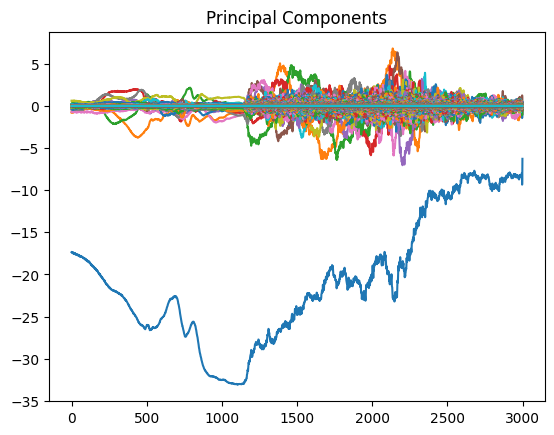

In [12]:
# Compute the principal components by multiplying the grayscale image array with the eigenvectors matrix

principalComponents = np.dot(imgGrayArray, eigenVectors) 

# Plot the principal components to visualize it
plt.plot(principalComponents)
plt.title('Principal Components')
plt.show()


### Calculate the explained variance


To figure out how many principal components are we going to choose for our new feature subspace, we can use the explained variance. The explained variance can be calculated from the eigenvalues. The explained variance can be calculated using the following equation:
\begin{align}
\mathbf{\text{var explained}} = \frac{\sum_{i=1}^k λ_i}{\sum_{i=1}^N\lambda_i}\tag{1}
\end{align}

Here, $λ_i$ is the $i^{th}$ eigenvalue and $N$ is the total number of eigenvalues.

The explained variance tells us how much information (variance) can be attributed to each of the principal components.<br>

The larger the variance explained by a principal component, the more important that component is.



In [13]:
# calculate the explained variance by finding the cumulative sum of the eigenvalues and dividing by the sum of all eigenvalues
explainedVariance = np.cumsum(eigenValues)/np.sum(eigenValues)

print("Explained Variance: ", explainedVariance)



Explained Variance:  [0.52244142 0.56533963 0.60111542 ... 0.99999996 0.99999998 1.        ]


## Experiment with different number of principle components

#### Number of Principle Components that explain 94% of the variance

In [14]:
# find the number of principal components needed to get 94% of the variance

n_components = np.argmax(explainedVariance > 0.94) + 1  #find the index of the first principal component that has explained variance greater than 0.94
print("Number of principal components needed to get 94% of the variance: ", str(n_components))


Number of principal components needed to get 94% of the variance:  321


#### Plotting the explained variance for different number of principle components

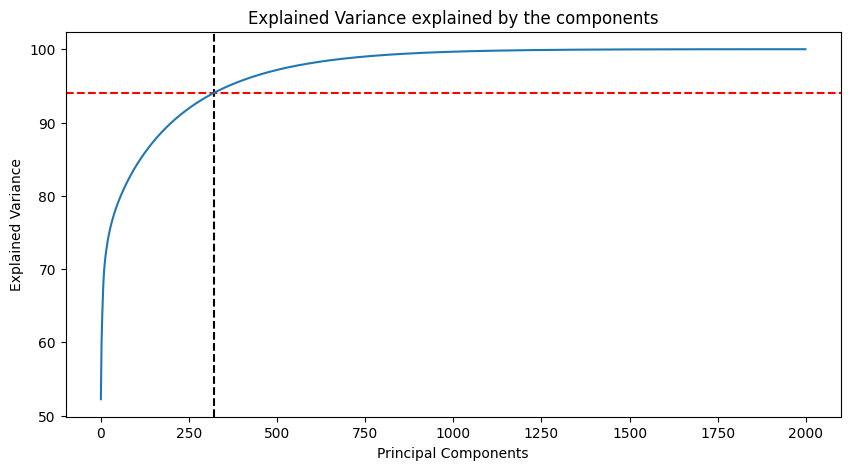

In [15]:
# Plot the explained variance to visualize it
# The vertical line is the number of principal components needed to get 94% of the variance

plt.figure(figsize=[10,5])
plt.title('Explained Variance explained by the components')
plt.ylabel('Explained Variance')
plt.xlabel('Principal Components')
plt.axvline(x=n_components, color="k", linestyle="--")
plt.axhline(y=94, color="r", linestyle="--")
ax = plt.plot(explainedVariance*100)

### Image Reconstruction
#### Reconstruction of the image using 94% of the variance explained by the top 321 principle components 

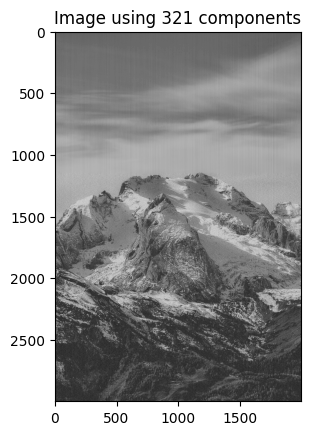

Error:  19217.178568892687


In [16]:
# reconstruct the image using the top 321 principal components

topKEigenVectors = eigenVectors[:,0:n_components] # select the top n_components eigenvectors

#reconstruct the image by multiplying the top n_components principal components with the top n_components eigenvectors
reconstructedImage = np.dot(principalComponents[:,0:n_components], topKEigenVectors.T) 

# display the reconstructed image
plt.imshow(reconstructedImage, cmap='gray')
plt.title(f'Image using {n_components} components')
plt.show()


# calculate the error between the original image and the reconstructed image
error = np.sum((imgGrayArray - reconstructedImage)**2)
print("Error: ", error)


The image is reconstructed using the top 321 principle components that explain 94% of the variance. The image is clear and the details are preserved. But the image is not as sharp as the original image. 

The top 321 principle components were used to reconstruct the image. The original image has 3000x2000 pixels. The dimension of the image was reduced from 2000 to 321. This is a huge reduction in the dimensionality of the image.


#### Number of Principle Components that explain 90% of the variance

In [17]:
# find the number of principal components needed to get 90% of the variance

n_components = np.argmax(explainedVariance > 0.90) + 1

print("Number of principal components needed to get 90% of the variance: ", str(n_components))

Number of principal components needed to get 90% of the variance:  202


#### Reconstruction of the image using 90% of the variance explained by the top 202 principle components 

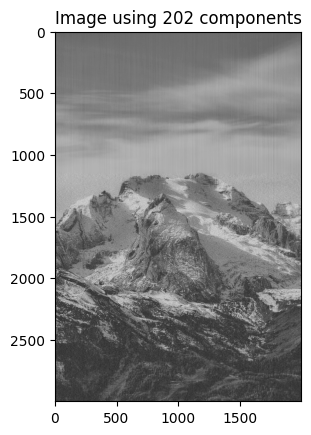

Error:  31812.268337553374


In [18]:
# Reconstruct the image using the top 202 principal components

topKEigenVectors = eigenVectors[:,0:n_components]
reconstructedImage = np.dot(principalComponents[:,0:n_components], topKEigenVectors.T)

# display the reconstructed image
plt.imshow(reconstructedImage, cmap='gray')
plt.title(f'Image using {n_components} components')
plt.show()


error = np.sum((imgGrayArray - reconstructedImage)**2)
print("Error: ", error)



The image is reconstructed using the top 202 principle components that explain 90% of the variance. The image is still clear and the details are preserved. It is not as sharp as the image reconstructed using 94% of the variance. 

The top 202 principle components were used to reconstruct the image. The dimension of the image was reduced from 2000 to 202. This is a huge reduction in the dimensionality of the image.

#### Number of Principle Components that explain 75% of the variance

In [19]:
# find the number of principal components needed to get 75% of the variance

n_components = np.argmax(explainedVariance > 0.75) + 1

print("Number of principal components needed to get 75% of the variance: ", str(n_components))

Number of principal components needed to get 75% of the variance:  25


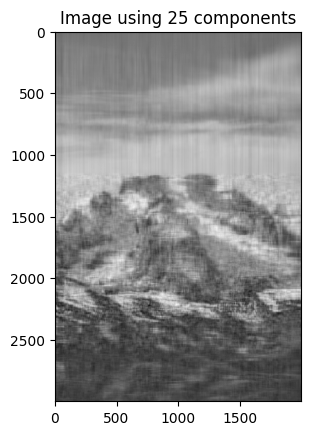

Error:  79745.62138848407


In [20]:
# Reconstruct the image using the top 25 principal components

topKEigenVectors = eigenVectors[:,0:n_components]
reconstructedImage = np.dot(principalComponents[:,0:n_components], topKEigenVectors.T)

# display the reconstructed image
plt.imshow(reconstructedImage, cmap='gray')
plt.title(f'Image using {n_components} components')
plt.show()


error = np.sum((imgGrayArray - reconstructedImage)**2)
print("Error: ", error)


The image is reconstructed using the top 25 principle components that explain 75% of the variance. The image is very blurry and the details are not preserved. This shows that the top 25 principle components does not have enough information to reconstruct the image to a reasonable quality.

The error of the reconstructed image is also very high.


### Conclusion

Three images were reconstructed using different number of principle components. The image reconstructed using 94% of the variance explained by the top 321 principle components is the best. The image is clear and the details are preserved. The image reconstructed using 90% of the variance explained by the top 202 principle components is also clear and the details are preserved but it is a little blurry. The image reconstructed using 75% of the variance explained by the top 25 principle components is very blurry and the details are not preserved. This shows that the top 25 principle components does not have enough information to reconstruct the image to a reasonable quality. Hence, the number of principle components that explain 94% of the variance is the best choice for reconstructing the image as it produces the best quality image while reducing the dimensionality of the image by a huge amount.